# ***Predictive Modeling of Critical Temperatures for Superconductors***

***Name :*** Lis Mary Antony 

***Organization :*** Entri Elevate

***Date :*** (Evaluation Date)

## 1. **Overview of Problem Statement:**

   The critical temperature *(Tc)* of superconductors determines their ability to exhibit superconducting properties, which are vital for applications in energy transmission, magnetic levitation, and quantum computing. Accurately predicting *Tc* is a challenging task due to the intricate relationships between material properties such as atomic mass, thermal conductivity, and electron affinity. Developing a robust predictive model can accelerate the discovery and design of high- *Tc* materials, revolutionizing advancements in material science and technology.

## 2. **Objective:**

   To develop the best predictive model for accurately estimating the critical temperature (*Tc*) of superconductors using machine learning techniques, enabling advancements in material design for energy-efficient and cutting-edge technological applications.

## 3. **Data Description:**

***Source of Data :*** UCI repository,  https://archive.ics.uci.edu/dataset/464/superconductivty+data

***Shape :*** Rows: 21263 x Columns: 82


***Features :*** 


**Atomic Mass Features:**
mean_atomic_mass, wtd_mean_atomic_mass (weighted mean), gmean_atomic_mass (geometric mean), entropy_atomic_mass, etc.

**Ionization Energy Features:**
mean_fie (first ionization energy), wtd_mean_fie, entropy_fie, etc.

**Atomic Radius Features:**
mean_atomic_radius, wtd_mean_atomic_radius, entropy_atomic_radius, etc.

**Density Features:**
mean_Density, wtd_mean_Density, entropy_Density, etc.

**Electron Affinity Features:**
mean_ElectronAffinity, wtd_mean_ElectronAffinity, entropy_ElectronAffinity, etc.

**Fusion Heat Features:**
mean_FusionHeat, wtd_mean_FusionHeat, entropy_FusionHeat, etc.

**Thermal Conductivity Features:**
mean_ThermalConductivity, wtd_mean_ThermalConductivity, entropy_ThermalConductivity, etc.

**Valence Features:**
mean_Valence, wtd_mean_Valence, entropy_Valence, etc.

**Range, Standard Deviation, and Weighted Variants:**
For each category above, the dataset includes features like range, std, and weighted variants.

***Target Variable:***
critical_temp (Critical Temperature in Kelvin) — the temperature below which the material exhibits superconductivity.

***Total Features: 81 features + 1 target column.***

## 4. **Data Collection**

Importing the python libraries

In [7]:
import numpy as np 
import pandas as pd 

import matplotlib.pyplot as plt 
import seaborn as sns 

%matplotlib inline

import warnings 
warnings.filterwarnings('ignore') 

from sklearn.preprocessing import PowerTransformer 
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV 
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.feature_selection import SelectKBest, f_regression, RFE 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.svm import SVR 
from scipy.stats import uniform 
from sklearn.pipeline import Pipeline

In [8]:
# Loading the dataset

data = pd.read_csv("SC.csv")

In [9]:
# Converting to dataframe

df= pd.DataFrame(data)

In [10]:
# Getting the summary of dataframe

print("\nSummary of DataFrame:\n")
df.info()


Summary of DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21263 entries, 0 to 21262
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               21263 non-null  int64  
 1   mean_atomic_mass                 21263 non-null  float64
 2   wtd_mean_atomic_mass             21263 non-null  float64
 3   gmean_atomic_mass                21263 non-null  float64
 4   wtd_gmean_atomic_mass            21263 non-null  float64
 5   entropy_atomic_mass              21263 non-null  float64
 6   wtd_entropy_atomic_mass          21263 non-null  float64
 7   range_atomic_mass                21263 non-null  float64
 8   wtd_range_atomic_mass            21263 non-null  float64
 9   std_atomic_mass                  21263 non-null  float64
 10  wtd_std_atomic_mass              21263 non-null  float64
 11  mean_fie                         21263 non-null  float64

In [11]:
# First 5 rows of dataframe

df.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


In [12]:
# Last 5 rows of dataframe

df.tail()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
21258,4,106.957877,53.095769,82.515384,43.135565,1.177145,1.254119,146.88130,15.504479,65.764081,...,3.555556,3.223710,3.519911,1.377820,0.913658,1,2.168889,0.433013,0.496904,2.44
21259,5,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
21260,2,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
21261,2,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84
21262,3,87.468333,86.858500,82.555758,80.458722,1.041270,0.895229,71.75500,43.144000,29.905282,...,4.500000,4.762203,4.242641,1.054920,0.970116,3,1.800000,1.414214,1.500000,12.80


In [13]:
# dimensions of DataFrame

df.shape

(21263, 82)

In [14]:
# getting descriptive statistics of numerical

df.describe()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,...,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000
mean,4.115224,87.557631,72.988310,71.290627,58.539916,1.165608,1.063884,115.601251,33.225218,44.391893,...,3.153127,3.056536,3.055885,1.295682,1.052841,2.041010,1.483007,0.839342,0.673987,34.421219
std,1.439295,29.676497,33.490406,31.030272,36.651067,0.364930,0.401423,54.626887,26.967752,20.035430,...,1.191249,1.046257,1.174815,0.393155,0.380291,1.242345,0.978176,0.484676,0.455580,34.254362
min,1.000000,6.941000,6.423452,5.320573,1.960849,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,3.000000,72.458076,52.143839,58.041225,35.248990,0.966676,0.775363,78.512902,16.824174,32.890369,...,2.116732,2.279705,2.091251,1.060857,0.775678,1.000000,0.921454,0.451754,0.306892,5.365000
50%,4.000000,84.922750,60.696571,66.361592,39.918385,1.199541,1.146783,122.906070,26.636008,45.123500,...,2.618182,2.615321,2.434057,1.368922,1.166532,2.000000,1.063077,0.800000,0.500000,20.000000
75%,5.000000,100.404410,86.103540,78.116681,73.113234,1.444537,1.359418,154.119320,38.356908,59.322812,...,4.026201,3.727919,3.914868,1.589027,1.330801,3.000000,1.918400,1.200000,1.020436,63.000000
max,9.000000,208.980400,208.980400,208.980400,208.980400,1.983797,1.958203,207.972460,205.589910,101.019700,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


In [15]:
# Renaming columns

df = df.rename(columns={'critical_temp': 'Critical_Temperature'})

In [16]:
# column labels

df.columns

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_

## 5. **Data Preprocessing - Data Cleaning:**

In [18]:
#  check for missing values

df.isnull().sum()

number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
range_Valence            0
wtd_range_Valence        0
std_Valence              0
wtd_std_Valence          0
Critical_Temperature     0
Length: 82, dtype: int64

In [19]:
# check for duplicate rows

df.duplicated().sum()

66

In [20]:
# remove duplicate rows

df1 = df.drop_duplicates()

In [21]:
# check for any remaining duplicate rows

df1.duplicated().sum()

0

In [22]:
# select the numeric columns

numeric_columns = df1.select_dtypes(include = ['number']).columns

In [23]:
# Print total numerical features and their names

print("Total Numerical Features:",numeric_columns.shape)
print("Numeric Features:",numeric_columns)

Total Numerical Features: (82,)
Numeric Features: Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffi

In [24]:
# total number of categorical features and the names

categorical_columns = df1.select_dtypes(include='object').columns
print("Total Categorical Features:",categorical_columns.shape)
print("Categorical Features:",categorical_columns)

Total Categorical Features: (0,)
Categorical Features: Index([], dtype='object')


In [25]:
# columns with numeric data type 

num_columns = df1.select_dtypes(include = ['number'])

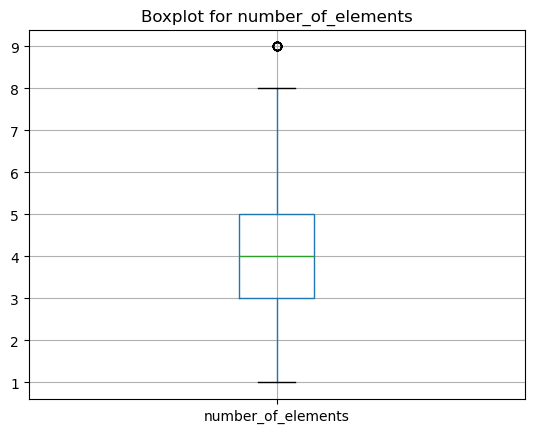

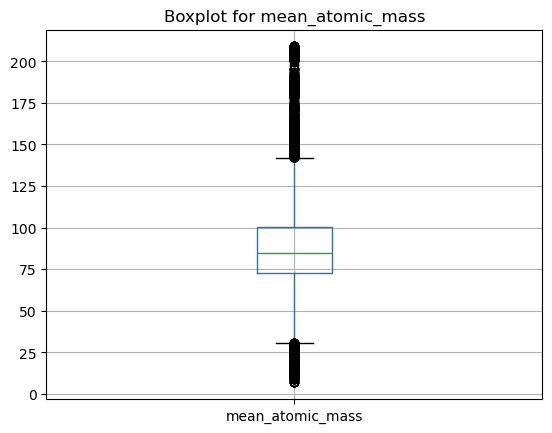

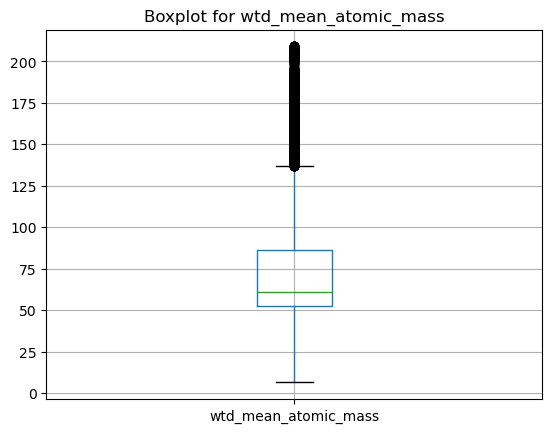

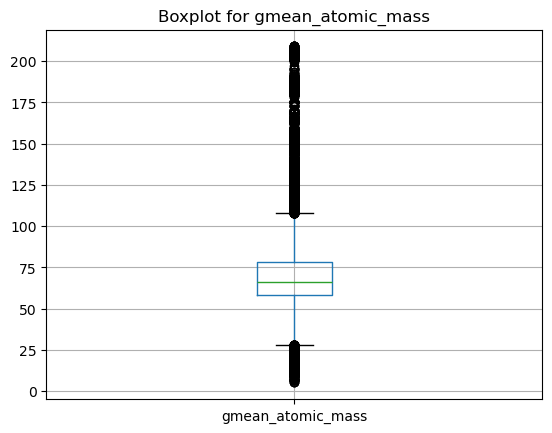

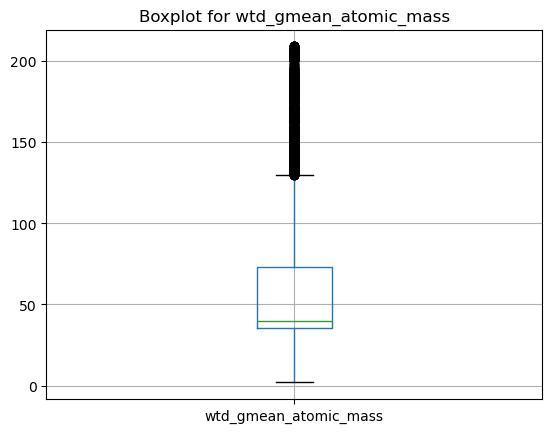

...

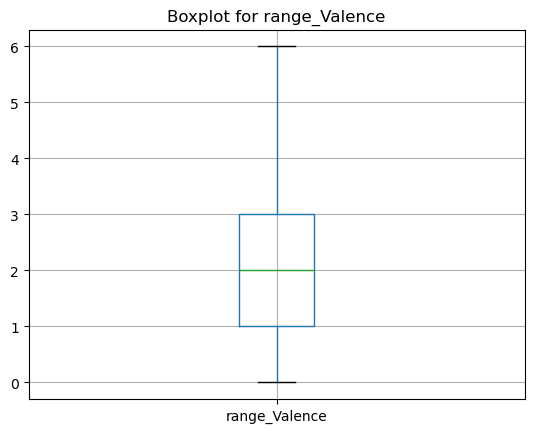

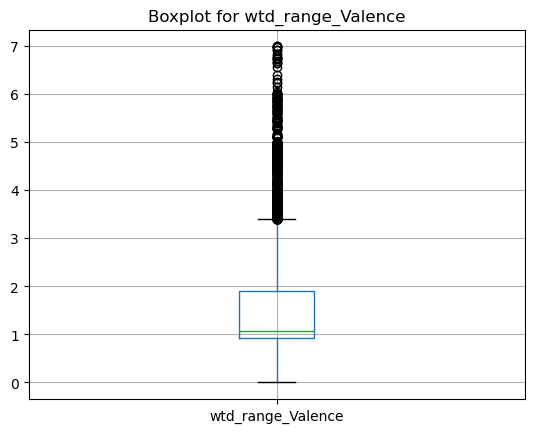

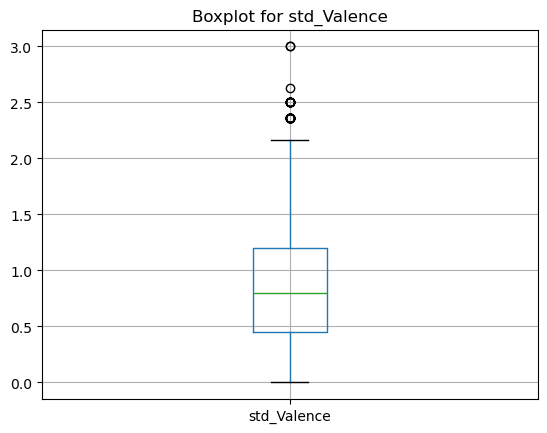

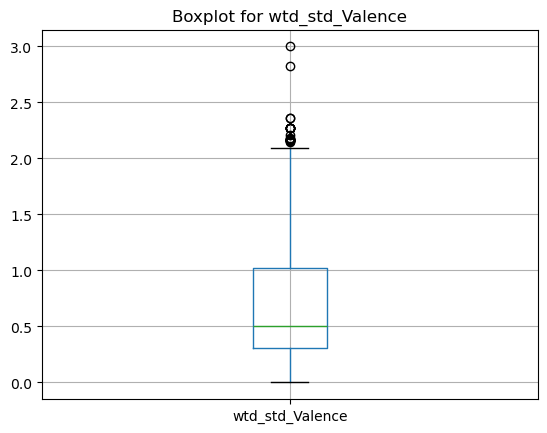

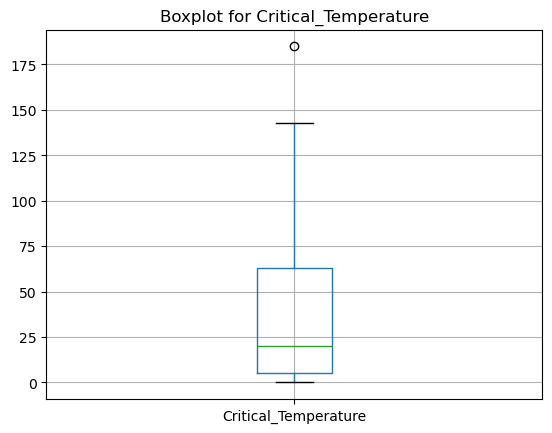

In [26]:
# separate boxplots for each numeric column 

for column in num_columns.columns:
    plt.figure()
    num_columns.boxplot(column = column)
    plt.title(f"Boxplot for {column}")

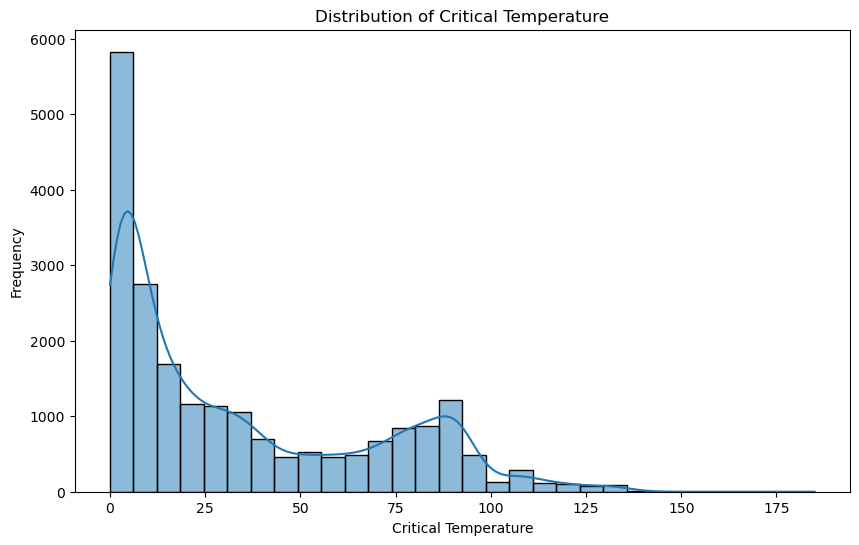

In [27]:
# generates a histogram for the Critical_Temperature column

plt.figure(figsize=(10,6))
sns.histplot(df1['Critical_Temperature'], bins=30, kde=True)
plt.title('Distribution of Critical Temperature') # Set the title of the plot
plt.xlabel('Critical Temperature') # Set the label for the x-axis
plt.ylabel('Frequency') # Set the label for y-axis
plt.show()

***Outliner Handling***

In [29]:
# Calculate Q1, Q3, and IQR
Q1 = df1[numeric_columns].quantile(0.25)
Q3 = df1[numeric_columns].quantile(0.75)
IQR = Q3 - Q1

In [30]:
# Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [31]:
outliers = ((df1[numeric_columns] < lower_bound) | (df1[numeric_columns] > upper_bound))
print("Number of outliers in each column:")
print(outliers.sum())

Number of outliers in each column:
number_of_elements         14
mean_atomic_mass         1604
wtd_mean_atomic_mass     1239
gmean_atomic_mass        3324
wtd_gmean_atomic_mass    1240
                         ... 
range_Valence               0
wtd_range_Valence        1447
std_Valence                44
wtd_std_Valence            25
Critical_Temperature        1
Length: 82, dtype: int64


In [32]:
# Define function for handling outliner using IQR

def handle_outliners_iqr(df):
    for col in df1.select_dtypes(include=['int64', 'float64']).columns:
        Q1 = df1[col].quantile(0.25)
        Q3 = df1[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define lower and upper bounds
        lower = Q1 - (1.5*IQR)
        upper = Q3 + (1.5*IQR)
        
        # Cap the outliners using capping (Winsorizing)
        df1[col] = df1[col].apply(lambda x: lower if x < lower else upper if x > upper else x)

    return df

df2 = handle_outliners_iqr(df1)

In [33]:
print("Shape after capping outliers:", df2[numeric_columns].shape)

Shape after capping outliers: (21197, 82)


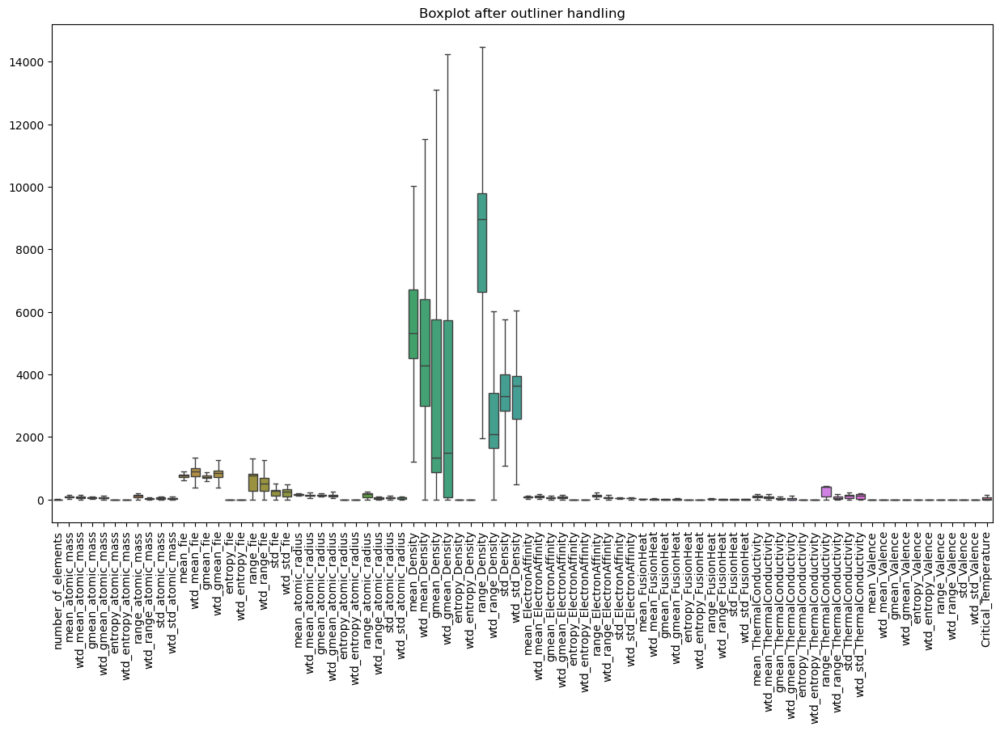

In [34]:
# generating a boxplot for the DataFrame df2 after handling outliers

plt.figure(figsize=(15,8))
sns.boxplot(data=df2)
plt.title('Boxplot after outliner handling')
plt.xticks(rotation = 90)
plt.show()

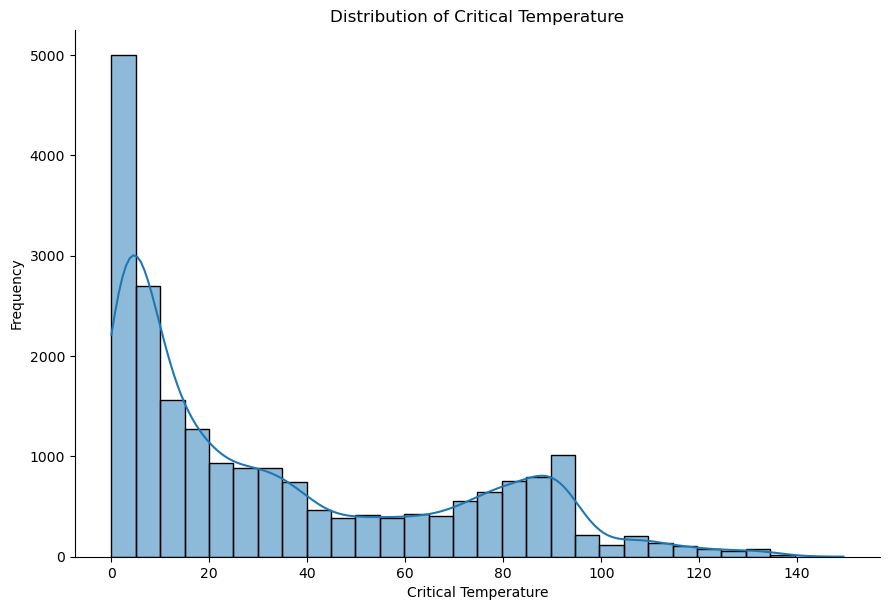

In [35]:
#  generating a distribution plot before transformation

sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5) # Create the distribution plot
plt.title('Distribution of Critical Temperature') # Set the title of the plot
plt.xlabel('Critical Temperature') # Set the label for the x-axis
plt.ylabel('Frequency') # Set the label fot the y-axis
plt.show()

***Skewness Addressing***

In [37]:
# Check skewness of numerical columns

numerical_features = df2.select_dtypes(include=['float64', 'int64']).columns


In [38]:
skewness = df2[numerical_features].skew()

# Categorize skewness
fairly_skewness = skewness[(skewness >= -0.5) & (skewness <= 0.5)]
moderate_skewness = skewness[(skewness > 0.5) & (skewness <= 1) | (skewness < -0.5) & (skewness >= -1)]
high_skewness = skewness[(skewness > 1) | (skewness < -1)]

In [39]:
# Displaying results
print("Skewness of Numeric Columns:\n", skewness)
print("\nFairly Skewness:\n", fairly_skewness)
print("\nModerate Skewness:\n", moderate_skewness)
print("\nHigh Skewness:\n", high_skewness)

Skewness of Numeric Columns:
 number_of_elements      -0.006686
mean_atomic_mass         0.238592
wtd_mean_atomic_mass     0.775944
gmean_atomic_mass        0.274809
wtd_gmean_atomic_mass    1.075224
                           ...   
range_Valence            0.467163
wtd_range_Valence        1.066129
std_Valence              0.430518
wtd_std_Valence          0.643303
Critical_Temperature     0.854317
Length: 82, dtype: float64

Fairly Skewness:
 number_of_elements                -0.006686
mean_atomic_mass                   0.238592
gmean_atomic_mass                  0.274809
range_atomic_mass                 -0.380418
std_atomic_mass                   -0.351072
wtd_std_atomic_mass               -0.312935
mean_fie                           0.145773
wtd_mean_fie                      -0.293684
gmean_fie                          0.429697
wtd_gmean_fie                     -0.320259
wtd_entropy_fie                    0.108396
range_fie                         -0.462307
wtd_range_fie         

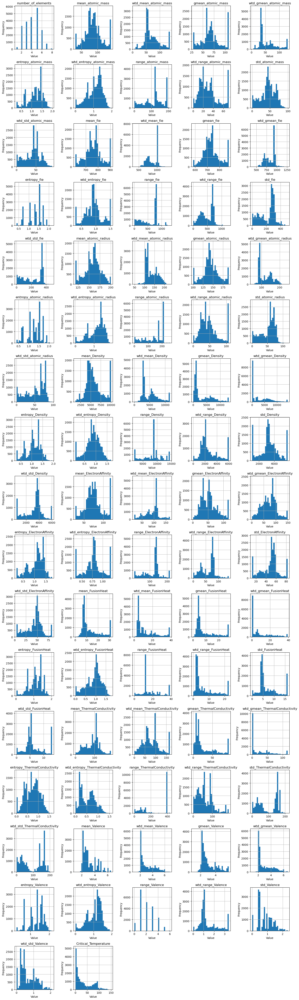

In [40]:
# Plot histograms before transformed features


# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

In [41]:
# Apply Yeo - Johnson transformation (works for both positive and negative values)

pt = PowerTransformer(method='yeo-johnson')
df2[numerical_features] = pt.fit_transform(df2[numerical_features])

print(df2[numerical_features].skew())

number_of_elements      -0.071642
mean_atomic_mass         0.009027
wtd_mean_atomic_mass     0.042693
gmean_atomic_mass       -0.018058
wtd_gmean_atomic_mass   -0.000500
                           ...   
range_Valence           -0.033536
wtd_range_Valence       -0.011222
std_Valence             -0.010309
wtd_std_Valence          0.026776
Critical_Temperature    -0.081885
Length: 82, dtype: float64


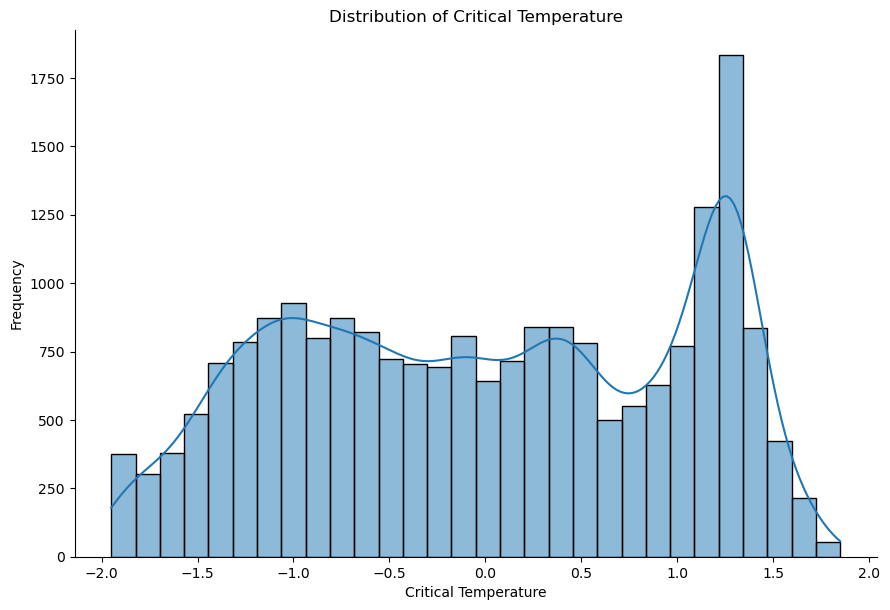

In [42]:
# distribution plot after transformation

sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5) # Create the distribution
plt.title('Distribution of Critical Temperature')
plt.xlabel('Critical Temperature')
plt.ylabel('Frequency')
plt.show()

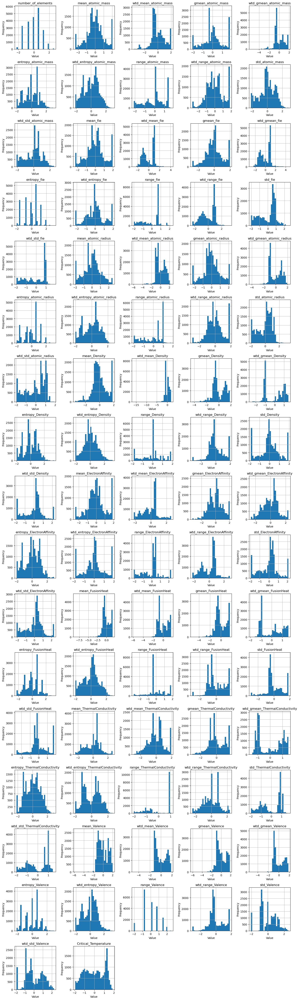

In [43]:
# Plot histograms after transformed features


# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

## 6. **Exploratory Data Analysis (EDA):**

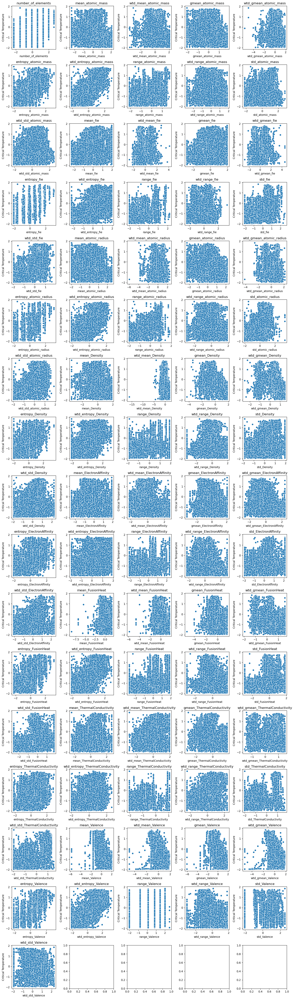

In [45]:
# generates scatter plots for each numerical feature

# List of numerical features (excluding 'Demand')
num_cols = [col for col in df2.columns if col != 'Critical_Temperature']

# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.scatterplot(data=df1, x=col, y='Critical_Temperature')
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('Critical Temperature')

# Adjust layout
plt.tight_layout()

# Save the plot as an image
plt.savefig("Scatter.png")

# Display the plot
plt.show()

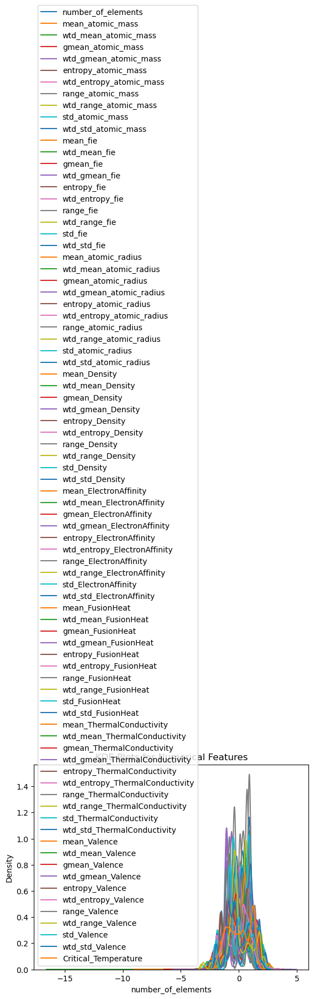

In [46]:
# to generate a Kernel Density Estimate (KDE) plot 

for column in df2.select_dtypes(include=['float64', 'int64']).columns:
    sns.kdeplot(df2[column], label=column)

plt.legend()
plt.title('KDE Plots for Numerical Features')
plt.show()

<Axes: xlabel='Critical_Temperature', ylabel='Density'>

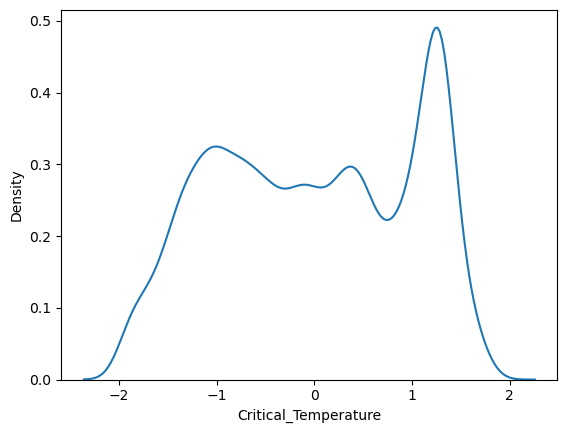

In [47]:
# to generate a Kernel Density Estimate (KDE) plot for target variable

sns.kdeplot(df2['Critical_Temperature'])

In [48]:
# calculates the correlation matrix for the numerical columns

corr1 = df2[numeric_columns].corr()

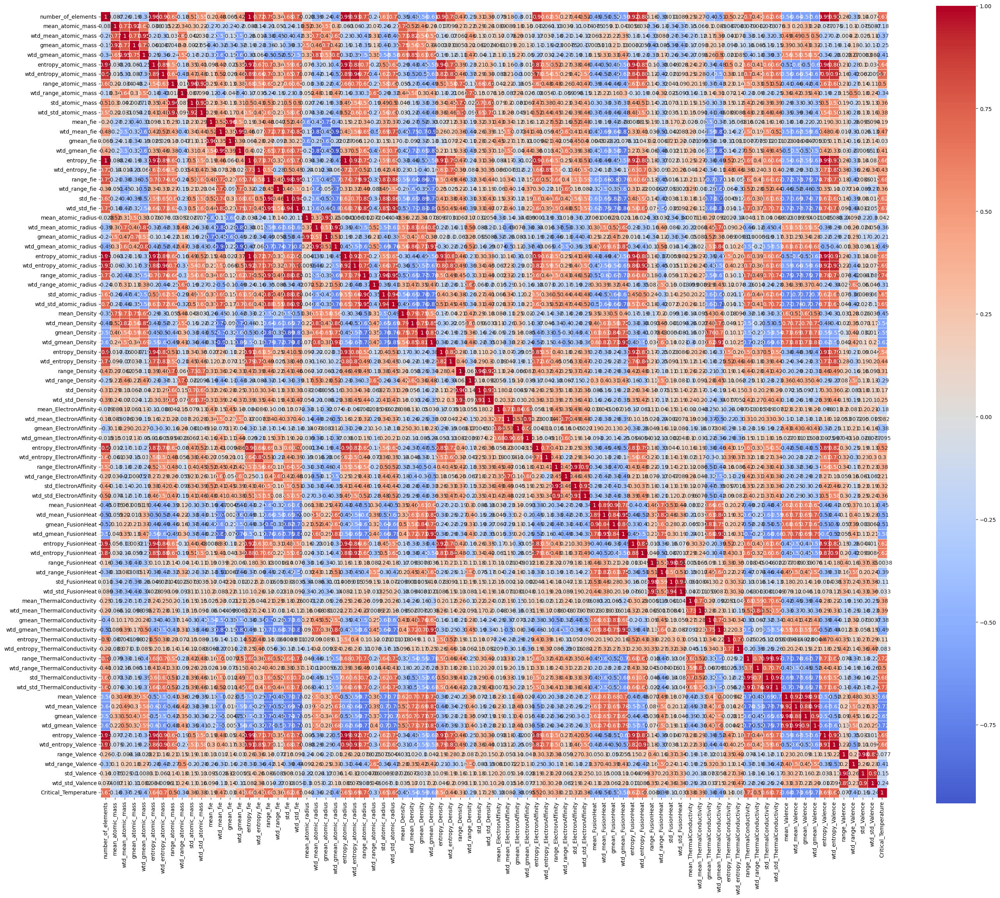

In [49]:
# Create the heatmap with annotations
plt.figure(figsize=(28,28))
sns.heatmap(corr1, annot=True, cmap='coolwarm', center=0, linewidths=0.5, cbar_kws={"shrink": 0.75}, square=True)

# Rotate x-axis and y-axis labels to make them readable
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Save the heatmap as an image
plt.savefig("corr.png")

# Show the plot
plt.tight_layout()  # To avoid overlap

# Display the heatmap
plt.show()

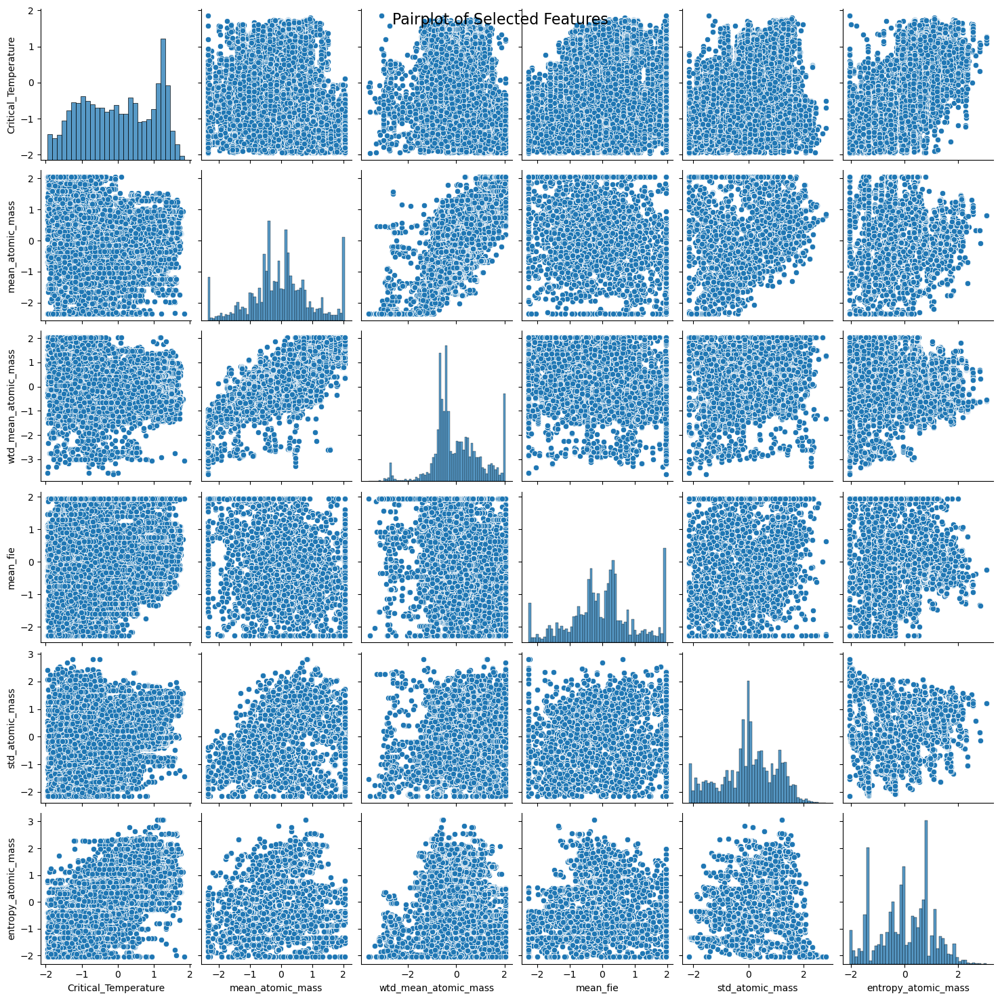

In [50]:
# Pairplot

subset = df2[['Critical_Temperature', 'mean_atomic_mass', 'wtd_mean_atomic_mass', 'mean_fie', 'std_atomic_mass', 'entropy_atomic_mass']]  
sns.pairplot(subset)
plt.suptitle("Pairplot of Selected Features", size=16)
plt.show()


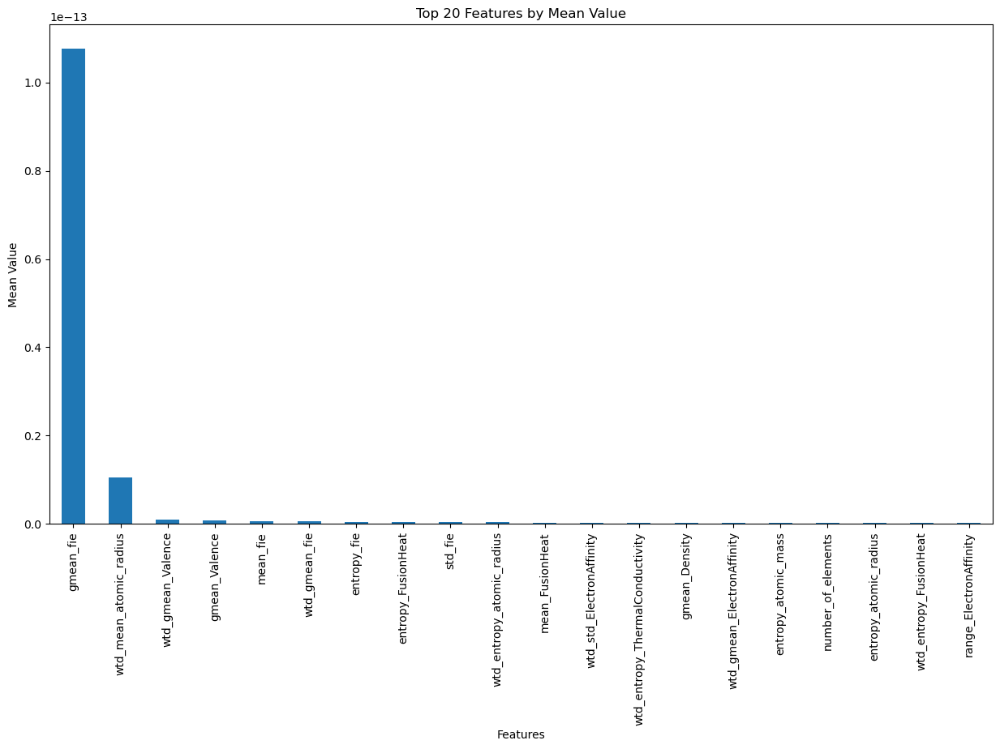

In [51]:
# Example: Bar plot for the mean of each feature

mean_values = df2.mean()
mean_values.sort_values(ascending=False).head(20).plot(kind='bar', figsize=(15, 8))
plt.title("Top 20 Features by Mean Value")
plt.xlabel("Features")
plt.ylabel("Mean Value")
plt.show()

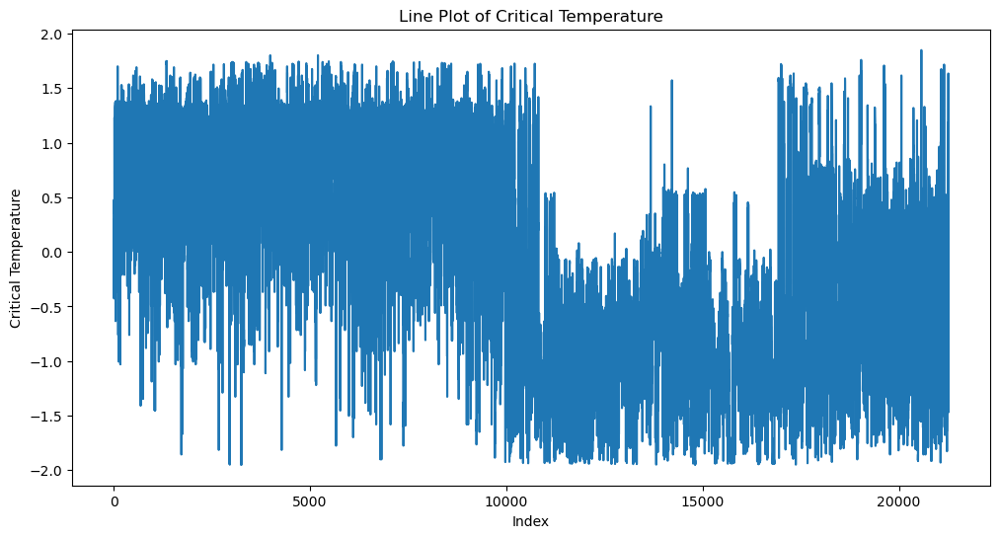

In [52]:
# Example: Line plot of 'critical_temp' over the index (if temporal data exists)

plt.figure(figsize=(12, 6))
sns.lineplot(data=df2['Critical_Temperature'])
plt.title('Line Plot of Critical Temperature')
plt.xlabel('Index')
plt.ylabel('Critical Temperature')
plt.show()


## 7. **Feature Engineering:**

In [54]:
# Identify categorical features

categorical_columns = df2.select_dtypes(include=['object', 'category']).columns
print("Categorical Columns:", categorical_columns)

Categorical Columns: Index([], dtype='object')


## 8. **Feature Selection:**

**Setting Target Value**

In [57]:
# Feature matrix (excluding the target column)
x = df2.drop(columns=['Critical_Temperature'])
y = df2['Critical_Temperature']

In [58]:
x

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
0,-0.065942,0.126552,-0.385565,-0.019725,-0.589768,-0.095504,-0.129456,0.132042,0.230730,0.368219,...,-1.069330,-0.752594,-0.928947,-0.704166,0.056481,-0.103188,-0.805145,-0.249851,-0.818586,-0.404263
1,0.621509,0.271084,-0.359438,0.292696,-0.575102,0.790703,-0.141715,0.132042,0.448849,0.120898,...,-1.625486,-0.752594,-1.729337,-0.720987,0.641479,-0.157170,0.092109,-0.184148,-0.345764,-0.318669
2,-0.065942,0.126552,-0.384664,-0.019725,-0.589458,-0.095504,-0.352337,0.132042,0.428455,0.368219,...,-1.069330,-0.728302,-0.928947,-0.680573,0.056481,-0.207793,-0.805145,-0.205836,-0.818586,-0.383306
3,-0.065942,0.126552,-0.385115,-0.019725,-0.589613,-0.095504,-0.234312,0.132042,0.331112,0.368219,...,-1.069330,-0.740413,-0.928947,-0.692352,0.056481,-0.152615,-0.805145,-0.227736,-0.818586,-0.393561
4,-0.065942,0.126552,-0.386467,-0.019725,-0.590078,-0.095504,0.050755,0.132042,0.019662,0.368219,...,-1.069330,-0.777167,-0.928947,-0.727894,0.056481,-0.017005,-0.805145,-0.294741,-0.818586,-0.427070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,-0.065942,0.802712,-0.580750,0.709424,-0.252195,-0.109549,0.406061,0.570626,-0.767702,1.074184,...,0.362535,0.688515,0.529230,0.779676,0.082538,-0.516943,-0.805145,0.990299,-0.818586,-0.244007
21259,0.621509,0.253498,-0.755588,-0.092727,-0.768668,0.353827,1.419530,1.329216,-1.491119,1.252922,...,-1.171731,-1.143694,-1.024669,-1.065939,0.765181,0.745045,-0.805145,-0.550248,-0.901627,-1.096631
21260,-1.495169,0.532372,0.911780,1.421267,1.260506,-1.336736,-1.323933,-1.875317,1.182351,-1.855278,...,1.276913,1.334202,1.374211,1.394390,-1.503222,-1.508915,-0.805145,1.706340,-0.654471,-0.508157
21261,-1.495169,0.532372,0.956255,1.421267,1.288932,-1.336736,-1.110121,-1.875317,0.195396,-1.855278,...,1.276913,1.291733,1.374211,1.353898,-1.503222,-1.274811,-0.805145,1.025026,-0.654471,-0.335057


***Select KBest, f_Regression***

In [60]:
# Apply SelectKBest with the F-test for regression

k_best = SelectKBest(score_func=f_regression, k='all')  # You can adjust 'k' to select specific features
x_new = k_best.fit_transform(x, y)

In [61]:
# Get the scores for each feature

scores = k_best.scores_

In [62]:
# Create a DataFrame with feature names and their corresponding scores

feature_scores = pd.DataFrame({"Feature": x.columns, "Score": scores})
feature_scores = feature_scores.sort_values(by="Score", ascending=False)

In [63]:
# Display the top features

print(feature_scores.head(20))

                        Feature         Score
27          range_atomic_radius  25357.170066
70  wtd_std_ThermalConductivity  24102.426329
72             wtd_mean_Valence  23968.553989
74            wtd_gmean_Valence  22428.895165
67    range_ThermalConductivity  22211.383174
6       wtd_entropy_atomic_mass  20172.287914
75              entropy_Valence  19521.685194
30        wtd_std_atomic_radius  19520.777473
26    wtd_entropy_atomic_radius  19227.976753
71                 mean_Valence  18618.891769
69      std_ThermalConductivity  18467.449392
17                    range_fie  18182.721326
0            number_of_elements  17482.938085
20                  wtd_std_fie  16882.021582
76          wtd_entropy_Valence  16430.056901
15                  entropy_fie  16320.423064
73                gmean_Valence  15923.084765
29            std_atomic_radius  15370.503522
25        entropy_atomic_radius  15272.295190
5           entropy_atomic_mass  14360.717672


***Removing redundant or irrelevant features***

In [65]:
# Calculate the correlation matrix
corr_matrix = df2.corr()

# Set a correlation threshold (e.g., 0.95 for high correlation)
threshold = 0.95

# Get the indices of the upper triangle of the correlation matrix (since it's symmetrical)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find columns with correlation greater than the threshold
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

print("Redundant features to drop:", to_drop)


Redundant features to drop: ['entropy_atomic_mass', 'std_atomic_mass', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'std_fie', 'wtd_gmean_atomic_radius', 'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius', 'std_Density', 'std_ElectronAffinity', 'std_FusionHeat', 'std_ThermalConductivity', 'wtd_std_ThermalConductivity', 'gmean_Valence', 'wtd_gmean_Valence', 'entropy_Valence', 'std_Valence']


In [66]:

# Drop the redundant features
df3 = df2.drop(columns=to_drop)

In [67]:
df3.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,mean_Valence,wtd_mean_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,wtd_std_Valence,Critical_Temperature
0,-0.065942,0.126552,-0.385565,-0.019725,-0.589768,-0.129456,0.132042,0.230730,0.607897,0.181437,...,-0.853566,0.908937,0.068651,-1.069330,-0.752594,-0.103188,-0.805145,-0.249851,-0.404263,0.297606
1,0.621509,0.271084,-0.359438,0.292696,-0.575102,-0.141715,0.132042,0.448849,0.625774,0.052900,...,0.192863,1.051111,-0.074331,-1.625486,-0.752594,-0.157170,0.092109,-0.184148,-0.318669,0.208964
2,-0.065942,0.126552,-0.384664,-0.019725,-0.589458,-0.352337,0.132042,0.428455,0.609585,0.181437,...,-0.901351,0.908937,0.068651,-1.069330,-0.728302,-0.207793,-0.805145,-0.205836,-0.383306,-0.035802
3,-0.065942,0.126552,-0.385115,-0.019725,-0.589613,-0.234312,0.132042,0.331112,0.608741,0.181437,...,-0.875922,0.908937,0.068651,-1.069330,-0.740413,-0.152615,-0.805145,-0.227736,-0.393561,0.076786
4,-0.065942,0.126552,-0.386467,-0.019725,-0.590078,0.050755,0.132042,0.019662,0.606208,0.181437,...,-0.815397,0.908937,0.068651,-1.069330,-0.777167,-0.017005,-0.805145,-0.294741,-0.427070,0.111554


## 9. **Split Data into Training and Testing Sets:**

In [69]:
# Feature matrix and target variable

X = df3.drop(columns=['Critical_Temperature'])  # Features (independent variables)
Y = df3['Critical_Temperature']  # Target (dependent variable)

In [70]:
# Split the data into training (80%) and testing (20%) sets

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [71]:
# Print the shape of the training and testing sets
print("Training features shape:", X_train.shape)
print("Testing features shape:", X_test.shape)
print("Training target shape:", Y_train.shape)
print("Testing target shape:", Y_test.shape)

Training features shape: (16957, 61)
Testing features shape: (4240, 61)
Training target shape: (16957,)
Testing target shape: (4240,)


## 10. **Feature Scaling:**

In [73]:
# Instantiate the StandardScaler

scaler = StandardScaler()

In [74]:
# Fit and transform the training data, and transform the test data

X_train_scaled = scaler.fit_transform(X_train)  # Fit and scale training data
X_test_scaled = scaler.transform(X_test)  # Use the fitted scaler to scale test data

In [75]:
# the list of selected features, make sure it matches the number of features in X_train_scaled

selected_features = X_train.columns.tolist()  # This will give the correct column names

In [76]:
# to check the transformed data

X_standardized = pd.DataFrame(X_train_scaled, columns=selected_features)
X_standardized

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,entropy_ThermalConductivity,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,mean_Valence,wtd_mean_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,wtd_std_Valence
0,-1.492933,1.873997,1.740711,1.770445,1.680203,-1.004078,-0.509413,-1.382524,0.046390,-0.747176,...,-0.125430,0.480024,-1.926787,-1.379643,1.509863,1.403061,-1.106316,-2.041326,0.056841,-1.938442
1,-0.065841,-0.362733,-0.655326,-0.355184,-0.647970,0.517584,0.098407,-0.858698,0.132403,0.448426,...,-1.194824,-1.088726,0.909094,0.836569,-1.072612,-1.089599,0.310880,-0.805474,-0.669886,-0.915717
2,1.955320,0.088375,0.469481,0.100950,0.556513,1.517140,1.372394,-0.281052,0.506397,0.115568,...,1.819422,0.897555,0.909094,1.231160,-0.737469,-0.685705,2.358241,0.090738,-1.367696,0.152451
3,-0.065841,-1.873442,-1.209966,-1.834702,-0.879223,0.187096,-0.707244,-0.616871,-0.621524,1.959133,...,-0.980271,-0.565564,-0.555607,-0.269959,0.360082,0.270038,0.613843,1.444602,-0.696505,1.631677
4,-0.065841,-0.359820,-0.429367,-0.357463,-0.609249,-0.344016,0.127214,0.388695,0.548804,0.350095,...,-0.996023,-0.780828,0.909094,0.068533,-1.072612,-0.744416,-0.156322,-0.805474,-0.229217,-0.395270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16952,-1.492933,-2.356506,-1.957730,-2.074494,-1.224428,-1.064331,-2.074411,-1.593235,-2.014399,-1.586023,...,-0.179751,0.349810,-1.056320,0.519215,-0.615525,-0.242746,-1.192018,-0.805474,-0.390808,-0.265402
16953,-0.065841,2.054751,1.577438,1.770445,1.583250,0.753752,-0.251190,-1.054147,0.070447,0.123257,...,1.793410,1.794618,-0.882038,-0.293862,1.781255,1.592425,0.520749,-0.805474,0.311151,-0.280540
16954,0.620583,0.376238,-0.424044,0.302114,-0.553281,1.124846,0.750088,-0.848695,0.563788,-0.292028,...,-0.168035,-0.699143,0.909094,0.863007,-1.175072,-1.087324,0.577913,-0.805474,-0.397292,-0.909832
16955,-0.065841,0.262267,-0.266243,0.059097,-0.550888,-0.300722,0.336212,0.473149,0.836167,0.314959,...,-1.425650,-0.924433,0.909094,0.068533,-0.234743,-0.673923,-0.015844,0.090738,-0.298361,-0.224566
